In [1]:
import argparse
import sys
import os
import json
import torch
import os
import random
import utils
import data_utils
import json

import cbm
import plots
def parse_args():
    parser = argparse.ArgumentParser(description='Settings for creating CBM')
    # parser.add_argument('--batch_size', default=64, type=int)
    # parser.add_argument('--epochs', default=30, type=int)
    parser.add_argument('--update_freq', default=1, type=int)
    parser.add_argument('--save_ckpt_freq', default=100, type=int)

    # Model parameters
    parser.add_argument('--model', default='vit_base_patch16_224', type=str, metavar='MODEL',
                        help='Name of model to train')
    parser.add_argument('--tubelet_size', type=int, default= 2)
    parser.add_argument('--input_size', default=224, type=int,
                        help='videos input size')

    parser.add_argument('--fc_drop_rate', type=float, default=0.0, metavar='PCT',
                        help='Dropout rate (default: 0.)')
    parser.add_argument('--drop', type=float, default=0.0, metavar='PCT',
                        help='Dropout rate (default: 0.)')
    parser.add_argument('--attn_drop_rate', type=float, default=0.0, metavar='PCT',
                        help='Attention dropout rate (default: 0.)')
    parser.add_argument('--drop_path', type=float, default=0.1, metavar='PCT',
                        help='Drop path rate (default: 0.1)')

    parser.add_argument('--disable_eval_during_finetuning', action='store_true', default=False)
    parser.add_argument('--model_ema', action='store_true', default=False)
    parser.add_argument('--model_ema_decay', type=float, default=0.9999, help='')
    parser.add_argument('--model_ema_force_cpu', action='store_true', default=False, help='')

    # Optimizer parameters
    parser.add_argument('--opt', default='adamw', type=str, metavar='OPTIMIZER',
                        help='Optimizer (default: "adamw"')
    parser.add_argument('--opt_eps', default=1e-8, type=float, metavar='EPSILON',
                        help='Optimizer Epsilon (default: 1e-8)')
    parser.add_argument('--opt_betas', default=None, type=float, nargs='+', metavar='BETA',
                        help='Optimizer Betas (default: None, use opt default)')
    parser.add_argument('--clip_grad', type=float, default=None, metavar='NORM',
                        help='Clip gradient norm (default: None, no clipping)')
    parser.add_argument('--momentum', type=float, default=0.9, metavar='M',
                        help='SGD momentum (default: 0.9)')
    parser.add_argument('--weight_decay', type=float, default=0.05,
                        help='weight decay (default: 0.05)')
    parser.add_argument('--weight_decay_end', type=float, default=None, help="""Final value of the
        weight decay. We use a cosine schedule for WD and using a larger decay by
        the end of training improves performance for ViTs.""")

    parser.add_argument('--lr', type=float, default=1e-3, metavar='LR',
                        help='learning rate (default: 1e-3)')
    parser.add_argument('--layer_decay', type=float, default=0.75)

    parser.add_argument('--warmup_lr', type=float, default=1e-6, metavar='LR',
                        help='warmup learning rate (default: 1e-6)')
    parser.add_argument('--min_lr', type=float, default=1e-6, metavar='LR',
                        help='lower lr bound for cyclic schedulers that hit 0 (1e-5)')

    parser.add_argument('--warmup_epochs', type=int, default=5, metavar='N',
                        help='epochs to warmup LR, if scheduler supports')
    parser.add_argument('--warmup_steps', type=int, default=-1, metavar='N',
                        help='num of steps to warmup LR, will overload warmup_epochs if set > 0')

    # Augmentation parameters
    parser.add_argument('--color_jitter', type=float, default=0.4, metavar='PCT',
                        help='Color jitter factor (default: 0.4)')
    parser.add_argument('--num_sample', type=int, default=1,
                        help='Repeated_aug (default: 2)')
    parser.add_argument('--aa', type=str, default='rand-m7-n4-mstd0.5-inc1', metavar='NAME',
                        help='Use AutoAugment policy. "v0" or "original". " + "(default: rand-m7-n4-mstd0.5-inc1)'),
    parser.add_argument('--smoothing', type=float, default=0.1,
                        help='Label smoothing (default: 0.1)')
    parser.add_argument('--train_interpolation', type=str, default='bicubic',
                        help='Training interpolation (random, bilinear, bicubic default: "bicubic")')

    # Evaluation parameters
    parser.add_argument('--crop_pct', type=float, default=None)
    parser.add_argument('--short_side_size', type=int, default=224)
    parser.add_argument('--test_num_segment', type=int, default=5)
    parser.add_argument('--test_num_crop', type=int, default=3)

    # Random Erase params
    parser.add_argument('--reprob', type=float, default=0.25, metavar='PCT',
                        help='Random erase prob (default: 0.25)')
    parser.add_argument('--remode', type=str, default='pixel',
                        help='Random erase mode (default: "pixel")')
    parser.add_argument('--recount', type=int, default=1,
                        help='Random erase count (default: 1)')
    parser.add_argument('--resplit', action='store_true', default=False,
                        help='Do not random erase first (clean) augmentation split')

    # Mixup params
    parser.add_argument('--mixup', type=float, default=0.0,
                        help='mixup alpha, mixup enabled if > 0.')
    parser.add_argument('--cutmix', type=float, default=0.0,
                        help='cutmix alpha, cutmix enabled if > 0.')
    parser.add_argument('--cutmix_minmax', type=float, nargs='+', default=None,
                        help='cutmix min/max ratio, overrides alpha and enables cutmix if set (default: None)')
    parser.add_argument('--mixup_prob', type=float, default=0.0,
                        help='Probability of performing mixup or cutmix when either/both is enabled')
    parser.add_argument('--mixup_switch_prob', type=float, default=0.0,
                        help='Probability of switching to cutmix when both mixup and cutmix enabled')
    parser.add_argument('--mixup_mode', type=str, default='batch',
                        help='How to apply mixup/cutmix params. Per "batch", "pair", or "elem"')

    # Finetuning params
    parser.add_argument('--finetune', default='', help='finetune from checkpoint')
    parser.add_argument('--model_key', default='model|module', type=str)
    parser.add_argument('--model_prefix', default='', type=str)
    parser.add_argument('--init_scale', default=0.001, type=float)
    parser.add_argument('--use_checkpoint', action='store_true')
    parser.set_defaults(use_checkpoint=False)
    parser.add_argument('--use_mean_pooling', action='store_true')
    parser.set_defaults(use_mean_pooling=True)
    parser.add_argument('--use_cls', action='store_false', dest='use_mean_pooling')

    # Dataset parameters

    parser.add_argument('--eval_data_path', default=None, type=str,
                        help='dataset path for evaluation')
    parser.add_argument('--nb_classes', default=400, type=int,
                        help='number of the classification types')
    parser.add_argument('--imagenet_default_mean_and_std', default=True, action='store_true')
    parser.add_argument('--num_segments', type=int, default= 1)
    parser.add_argument('--num_frames', type=int, default= 16)
    parser.add_argument('--sampling_rate', type=int, default= 4)
    parser.add_argument('--data_set', default='Kinetics-400', choices=['kinetics100','kinetics400', 'mini-SSV2','SSV2', 'UCF101', 'HMDB51','image_folder'],
                        type=str, help='dataset')
    parser.add_argument('--output_dir', default='',
                        help='path where to save, empty for no saving')
    parser.add_argument('--log_dir', default=None,
                        help='path where to tensorboard log')
    # parser.add_argument('--device', default='cuda',
    #                     help='device to use for training / testing')
    parser.add_argument('--seed', default=0, type=int)
    parser.add_argument('--resume', default='',
                        help='resume from checkpoint')
    parser.add_argument('--auto_resume', action='store_true')
    parser.add_argument('--no_auto_resume', action='store_false', dest='auto_resume')
    parser.set_defaults(auto_resume=True)

    parser.add_argument('--save_ckpt', action='store_true')
    parser.add_argument('--no_save_ckpt', action='store_false', dest='save_ckpt')
    parser.set_defaults(save_ckpt=True)

    parser.add_argument('--start_epoch', default=0, type=int, metavar='N',
                        help='start epoch')
    parser.add_argument('--eval', action='store_true',
                        help='Perform evaluation only')
    parser.add_argument('--dist_eval', action='store_true', default=False,
                        help='Enabling distributed evaluation')
    parser.add_argument('--num_workers', default=10, type=int)
    parser.add_argument('--pin_mem', action='store_true',
                        help='Pin CPU memory in DataLoader for more efficient (sometimes) transfer to GPU.')
    parser.add_argument('--no_pin_mem', action='store_false', dest='pin_mem')
    parser.set_defaults(pin_mem=True)

    # distributed training parameters
    parser.add_argument('--world_size', default=1, type=int,
                        help='number of distributed processes')
    parser.add_argument('--local-rank', default=-1, type=int)
    parser.add_argument('--dist_on_itp', action='store_true')
    parser.add_argument('--dist_url', default='env://',
                        help='url used to set up distributed training')

    parser.add_argument('--enable_deepspeed', action='store_true', default=False)
    #!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    parser.add_argument("--dataset", type=str, default="cifar10")
    parser.add_argument("--s_concept_set", type=str, default=None, 
                        help="path to concept set name")
    parser.add_argument("--t_concept_set", type=str, default=None, 
                        help="path to concept set name")
    parser.add_argument("--backbone", type=str, default="clip_RN50", help="Which pretrained model to use as backbone")
    parser.add_argument("--clip_name", type=str, default="ViT-B/16", help="Which CLIP model to use")

    parser.add_argument("--device", type=str, default="cuda", help="Which device to use")
    parser.add_argument("--batch_size", type=int, default=512, help="Batch size used when saving model/CLIP activations")
    parser.add_argument("--saga_batch_size", type=int, default=256, help="Batch size used when fitting final layer")
    parser.add_argument("--proj_batch_size", type=int, default=50000, help="Batch size to use when learning projection layer")

    parser.add_argument("--feature_layer", type=str, default='layer4', 
                        help="Which layer to collect activations from. Should be the name of second to last layer in the model")
    parser.add_argument("--activation_dir", type=str, default='saved_activations', help="save location for backbone and CLIP activations")
    parser.add_argument("--save_dir", type=str, default='saved_models', help="where to save trained models")
    parser.add_argument("--clip_cutoff", type=float, default=0.25, help="concepts with smaller top5 clip activation will be deleted")
    parser.add_argument("--proj_steps", type=int, default=1000, help="how many steps to train the projection layer for")
    parser.add_argument("--interpretability_cutoff", type=float, default=0.45, help="concepts with smaller similarity to target concept will be deleted")
    parser.add_argument("--lam", type=float, default=0.0007, help="Sparsity regularization parameter, higher->more sparse")
    parser.add_argument("--n_iters", type=int, default=1000, help="How many iterations to run the final layer solver for")
    parser.add_argument("--print", action='store_true', help="Print all concepts being deleted in this stage")
    parser.add_argument('--data_path', default='data/video_annotation/ucf101', type=str,
                        help='dataset path')
    parser.add_argument('--video_anno_path',type=str)
    parser.add_argument('--center_frame',action='store_true')
    parser.add_argument('--no_aug',type=bool,default=False)
    parser.add_argument('--saved_features',action='store_true')
    parser.add_argument('--dual_encoder', default='clip', choices=['clip', 'lavila', 'internvid'],
                        type=str, help='dataset')
    parser.add_argument('--dual_encoder_frames',type=int,default=16)
    parser.add_argument('--lavila_ckpt',type=str,default=None)
    return parser

In [2]:



import json

def get_selected_args_from_file(args_file, selected_keys):
    # 파일을 읽어서 JSON 파싱
    with open(args_file, 'r') as f:
        args_dict = json.load(f)  # JSON 형식의 파일을 파이썬 딕셔너리로 변환

    # 선택한 key에 해당하는 값만 추출하여 argparse 형식으로 변환
    args_list = []
    for key in selected_keys:
        if key in args_dict:
            args_list.append(f'--{key}')  # key를 --key 형식으로 변환
            args_list.append(str(args_dict[key]))  # 값을 문자열로 변환해서 리스트에 추가

    return args_list


In [3]:
# change this to the  correct model dir, everything else should be taken care of
load_dir = "/data/jong980812/project/Video-CBM-two-stream/new_results/vmae/only-temporal_k400/model/kinetics400_cbm_2024_10_14_00_35"
selected_keys = [
        'data_set', 'nb_classes', 'video_anno_path', 'data_path', 'lavila_ckpt', 'finetune', 'backbone'
    ]
args_list = get_selected_args_from_file(os.path.join(load_dir,'args.txt'),selected_keys)  # 파일에서 인자 리스트 생성
parser = parse_args()
argument = parser.parse_args(args_list)  # 파일에서 읽은 인자로 파싱
device = "cuda"
with open(os.path.join(load_dir, "args.txt"), "r") as f:
    args = json.load(f)
dataset = args["data_set"]
_, target_preprocess = data_utils.get_target_model(args["backbone"], device,argument)
print('done')
s_model,t_model = cbm.load_cbm_two_stream(load_dir, device,argument)

Patch size = (16, 16)
Load ckpt from /data/datasets/video_checkpoint/kinetics400/k400_finetune.pth
Load state_dict by model_key = module



*********** VMAE Load ***************
done
**********Load Spatio model***************
Patch size = (16, 16)
Load ckpt from /data/datasets/video_checkpoint/kinetics400/k400_finetune.pth
Load state_dict by model_key = module



*********** VMAE Load ***************
**********Load Temporal model***************
Patch size = (16, 16)
Load ckpt from /data/datasets/video_checkpoint/kinetics400/k400_finetune.pth
Load state_dict by model_key = module



*********** VMAE Load ***************


In [4]:
val_d_probe = dataset+"_val"
cls_file = data_utils.LABEL_FILES[dataset]

val_data_t = data_utils.get_data(val_d_probe,args=argument)
print(val_data_t.center_frame)
argument.no_aug = True
argument.center_frame = True
val_pil_data = data_utils.get_data(val_d_probe,args=argument)

Number of the class = 400
False
Number of the class = 400


In [5]:
val_data_t.center_frame

False

In [6]:
with open(cls_file, "r") as f:
    classes = f.read().split("\n")

with open(os.path.join(load_dir, 'spatial',"concepts.txt"), "r") as f:
    s_concepts = f.read().split("\n")
with open(os.path.join(load_dir, 'temporal',"concepts.txt"), "r") as f:
    t_concepts = f.read().split("\n")

## Measure accuracy

In [7]:
# accuracy = cbm_utils.get_accuracy_cbm(model, val_data_t, device,32,8)
# print("Accuracy: {:.2f}%".format(accuracy*100))

## Show final layer weights for some classes

You can build a Sankey diagram of weights by copying the incoming weights printed below into https://sankeymatic.com/build/

In [8]:

to_show = random.choices([i for i in range(len(classes))], k=2)
to_show=[64,62]
for i in to_show:
    print("Output class:{} - {}\n".format(i, classes[i]))
    for context in ['Spatial','Temporal']:
        model = s_model if context=='Spatial' else t_model
        concepts = s_concepts if context=='Spatial' else t_concepts
        print(f"{context} Incoming weights:")
        for j in range(len(concepts)):
            if torch.abs(model.final.weight[i,j])>0.05:
                print("{} [{:.4f}] {}".format(concepts[j], model.final.weight[i,j], classes[i]))
        print()

Output class:64 - cleaning toilet

Spatial Incoming weights:
Clean something. [0.4122] cleaning toilet
Drizzle something on top. [-0.2190] cleaning toilet
Flush something with something. [1.6658] cleaning toilet
Stack something. [-0.1922] cleaning toilet

Temporal Incoming weights:
Clean something. [0.3283] cleaning toilet
Drizzle something on top. [-0.1026] cleaning toilet
Flush something with something. [1.7680] cleaning toilet
Stack something. [-0.1314] cleaning toilet
Trade something for something. [-0.1569] cleaning toilet

Output class:62 - cleaning pool

Spatial Incoming weights:
Anchor something near something. [0.0517] cleaning pool
Encourage something exciting. [-0.2458] cleaning pool
Express emotions through something. [-0.8644] cleaning pool
Mop something. [0.1760] cleaning pool
Pumping something. [0.0798] cleaning pool
Rinse something off with something. [0.1543] cleaning pool
Rotate something in a circular motion. [0.1373] cleaning pool
Snap something. [-0.2017] cleaning 

In [9]:
print(model.final.weight.shape)
zero_count = torch.sum(model.final.weight == 0).item()
print(zero_count)

torch.Size([400, 440])
169501


In [10]:
s_model.final.weight.numel()

176000

In [11]:
to_show = [i for i in range(argument.nb_classes)]#random.choices([i for i in range(len(classes))], k=100)
save_path = load_dir.split('model')[0]
# top_weights, top_weight_ids = torch.topk(model.final.weight, k=5, dim=1)
# bottom_weights, bottom_weight_ids = torch.topk(model.final.weight, k=5, dim=1, largest=False)

for context in ['spatial','temporal']:
    model = s_model if context=='spatial' else t_model
    concepts = s_concepts if context=='spatial' else t_concepts
    top_weights, top_weight_ids = torch.topk(model.final.weight, k=5, dim=1)
    bottom_weights, bottom_weight_ids = torch.topk(model.final.weight, k=5, dim=1, largest=False)
    with open(os.path.join(save_path,f"{context}_output.txt"), "w") as f:
        for i in to_show:
            f.write("Class {} - {}\n".format(i, classes[i]))
            
            out = "Highest weights: "
            for j in range(top_weights.shape[1]):
                idx = int(top_weight_ids[i, j].cpu())
                out += "{}:{:.3f}, ".format(concepts[idx], top_weights[i, j])
            f.write(out + "\n")
            
            out = "Lowest weights: "
            for j in range(bottom_weights.shape[1]):
                idx = int(bottom_weight_ids[i, j].cpu())
                out += "{}:{:.3f}, ".format(concepts[idx], bottom_weights[i, j])
            f.write(out + "\n\n")


In [12]:
# Some features may not have any non-zero outgoing weights, 
# i.e. these are not used by the model and should be deleted for better performance
s_weight_contribs = torch.sum(torch.abs(s_model.final.weight), dim=0)
t_weight_contribs = torch.sum(torch.abs(t_model.final.weight), dim=0)
print("Spatal- Num concepts with outgoing weights:{}/{}".format(torch.sum(s_weight_contribs>1e-5), len(s_weight_contribs)))
print("Temporal - Num concepts with outgoing weights:{}/{}".format(torch.sum(t_weight_contribs>1e-5), len(t_weight_contribs)))

Spatal- Num concepts with outgoing weights:438/440
Temporal - Num concepts with outgoing weights:438/440


## Explain model reasoning for random inputs

Image:0 Gt:somersaulting, 1st Pred:baby waking up, 4.389, 2nd Pred:shaking head, 4.059                                                  Image:0 Gt:somersaulting, 1st Pred:baby waking up, 4.133, 2nd Pred:sticking tongue out, 4.029


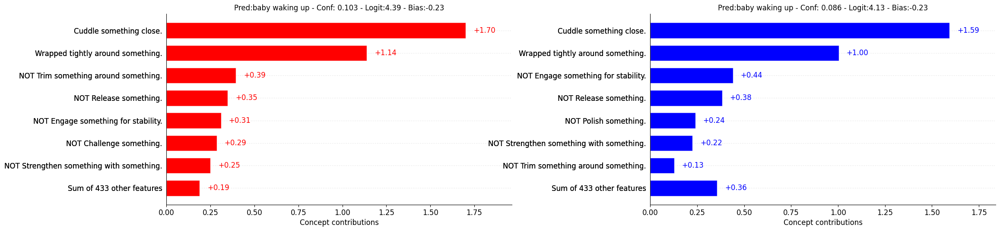

Image:1 Gt:playing harmonica, 1st Pred:playing harmonica, 8.987, 2nd Pred:brushing hair, 5.764                                                  Image:1 Gt:playing harmonica, 1st Pred:playing harmonica, 9.294, 2nd Pred:fixing hair, 5.896


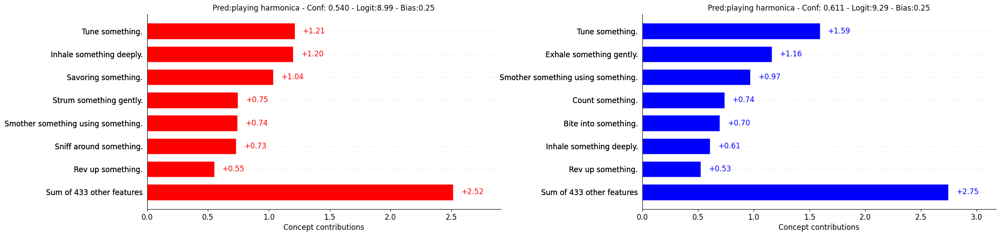

Image:2 Gt:pushing cart, 1st Pred:pushing cart, 7.596, 2nd Pred:walking the dog, 6.229                                                  Image:2 Gt:pushing cart, 1st Pred:pushing cart, 7.572, 2nd Pred:walking the dog, 6.405


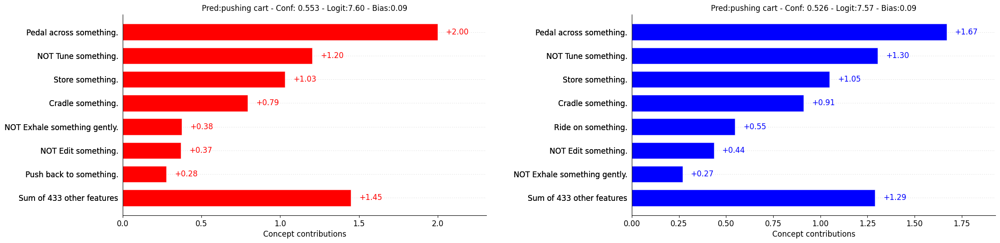

Image:3 Gt:sniffing, 1st Pred:kissing, 4.467, 2nd Pred:feeding birds, 4.447                                                  Image:3 Gt:sniffing, 1st Pred:kissing, 4.472, 2nd Pred:disc golfing, 4.177


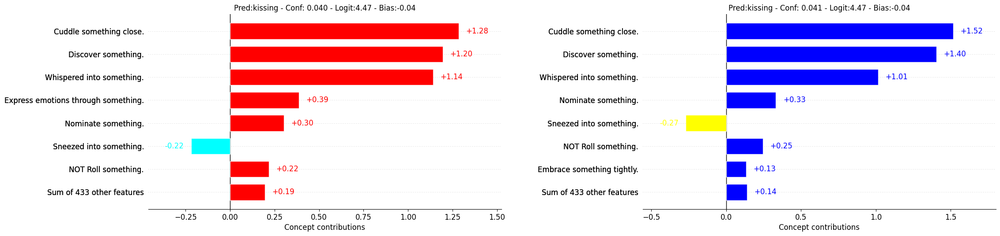

Image:4 Gt:playing saxophone, 1st Pred:playing saxophone, 5.535, 2nd Pred:tango dancing, 5.400                                                  Image:4 Gt:playing saxophone, 1st Pred:tango dancing, 5.507, 2nd Pred:playing saxophone, 5.473


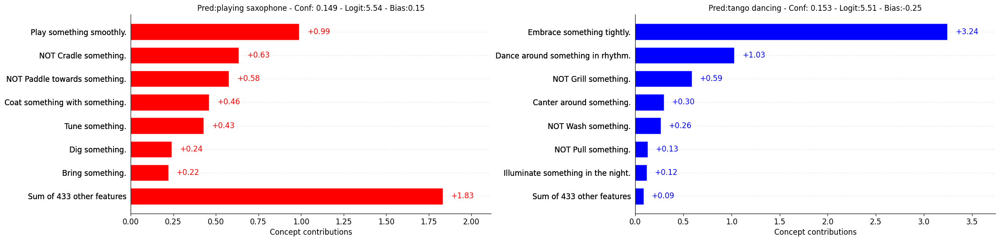

Image:5 Gt:stretching arm, 1st Pred:stretching arm, 7.040, 2nd Pred:stretching leg, 6.355                                                  Image:5 Gt:stretching arm, 1st Pred:stretching arm, 7.098, 2nd Pred:yoga, 6.304


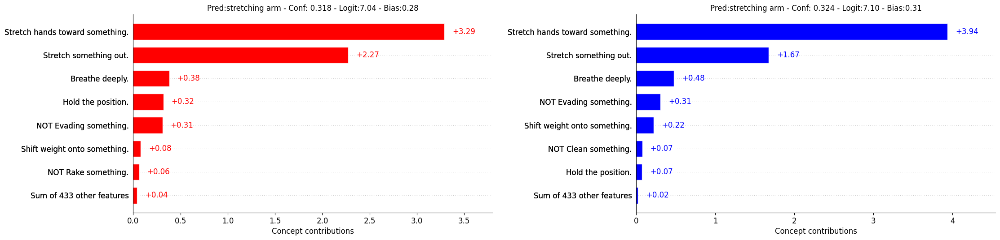

Image:6 Gt:drawing, 1st Pred:drawing, 9.109, 2nd Pred:writing, 5.851                                                  Image:6 Gt:drawing, 1st Pred:drawing, 9.030, 2nd Pred:writing, 6.261


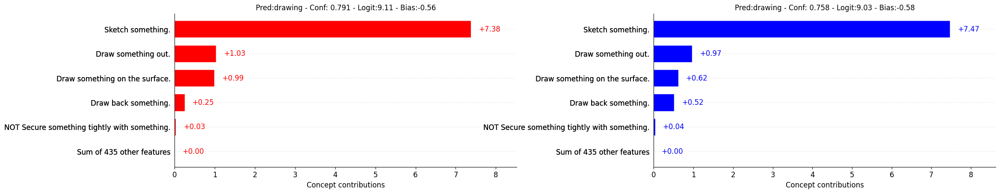

Image:7 Gt:massaging back, 1st Pred:massaging back, 8.770, 2nd Pred:massaging legs, 6.698                                                  Image:7 Gt:massaging back, 1st Pred:massaging back, 8.759, 2nd Pred:massaging legs, 6.731


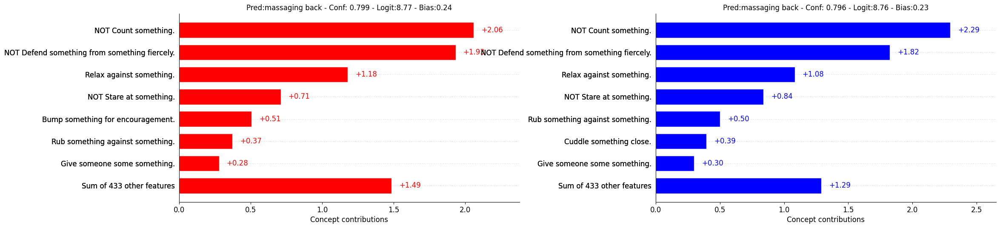

Image:8 Gt:brushing hair, 1st Pred:brushing hair, 9.360, 2nd Pred:dying hair, 5.836                                                  Image:8 Gt:brushing hair, 1st Pred:brushing hair, 8.862, 2nd Pred:dying hair, 5.857


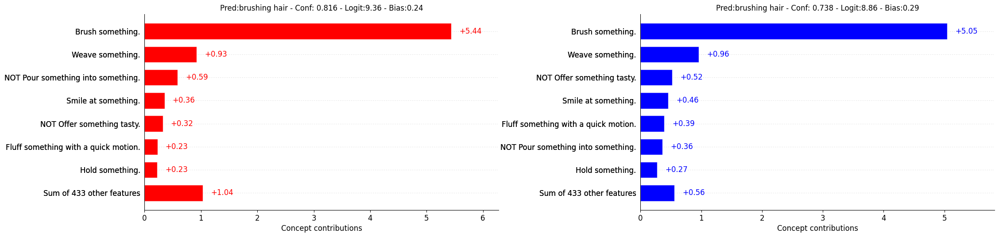

Image:9 Gt:blowing nose, 1st Pred:playing harmonica, 6.175, 2nd Pred:playing didgeridoo, 5.832                                                  Image:9 Gt:blowing nose, 1st Pred:playing harmonica, 5.874, 2nd Pred:playing didgeridoo, 5.815


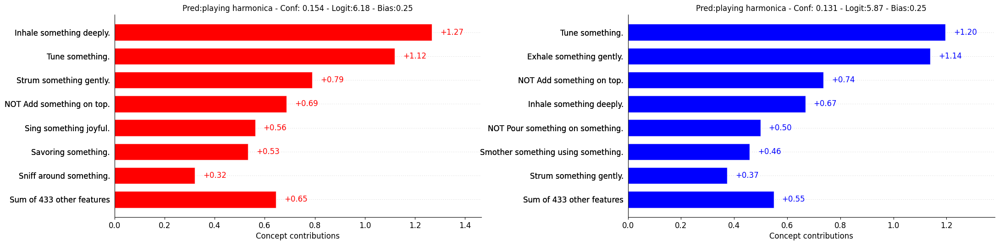

Image:10 Gt:carving pumpkin, 1st Pred:carving pumpkin, 10.277, 2nd Pred:peeling apples, 6.102                                                  Image:10 Gt:carving pumpkin, 1st Pred:carving pumpkin, 10.132, 2nd Pred:peeling apples, 6.115


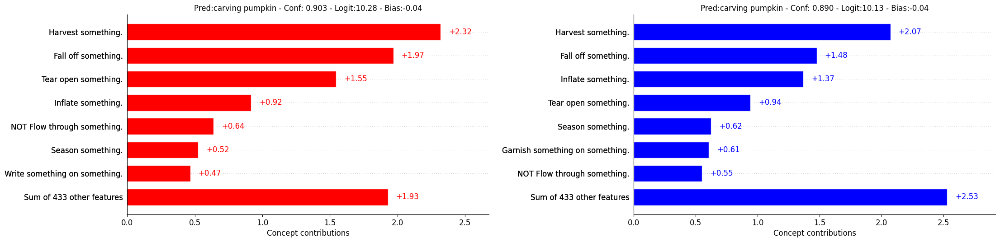

Image:11 Gt:passing American football (in game), 1st Pred:passing American football (in game), 8.733, 2nd Pred:kicking field goal, 5.510                                                  Image:11 Gt:passing American football (in game), 1st Pred:passing American football (in game), 8.783, 2nd Pred:kicking field goal, 5.258


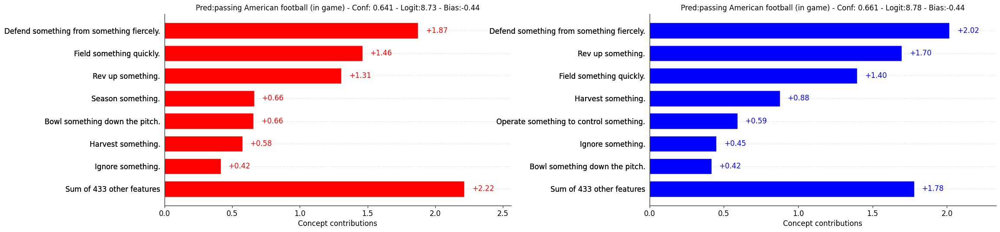

Image:12 Gt:drinking beer, 1st Pred:laughing, 5.865, 2nd Pred:shaking head, 5.306                                                  Image:12 Gt:drinking beer, 1st Pred:laughing, 5.865, 2nd Pred:sticking tongue out, 5.127


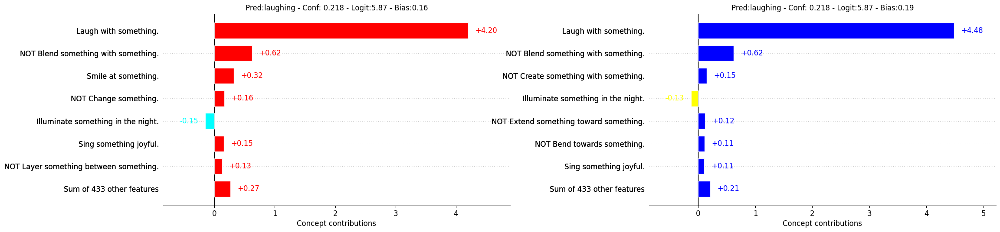

Image:13 Gt:folding clothes, 1st Pred:opening present, 8.685, 2nd Pred:wrapping present, 8.482                                                  Image:13 Gt:folding clothes, 1st Pred:opening present, 8.827, 2nd Pred:wrapping present, 8.693


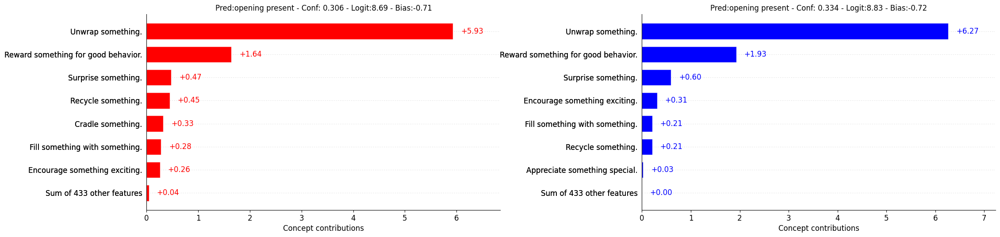

Image:14 Gt:massaging back, 1st Pred:massaging back, 6.457, 2nd Pred:waxing back, 6.378                                                  Image:14 Gt:massaging back, 1st Pred:waxing back, 6.578, 2nd Pred:massaging back, 6.109


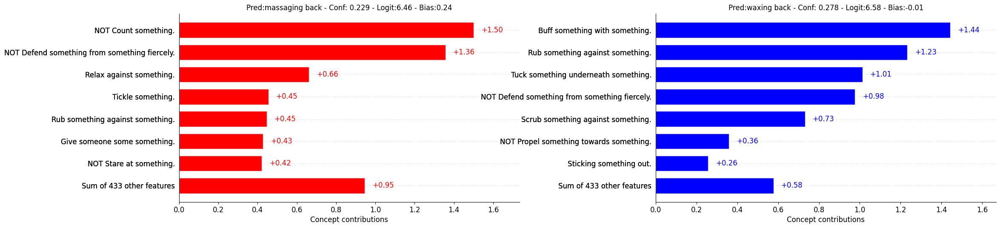

Image:15 Gt:jumpstyle dancing, 1st Pred:jumpstyle dancing, 7.503, 2nd Pred:high kick, 5.875                                                  Image:15 Gt:jumpstyle dancing, 1st Pred:jumpstyle dancing, 7.596, 2nd Pred:tap dancing, 5.923


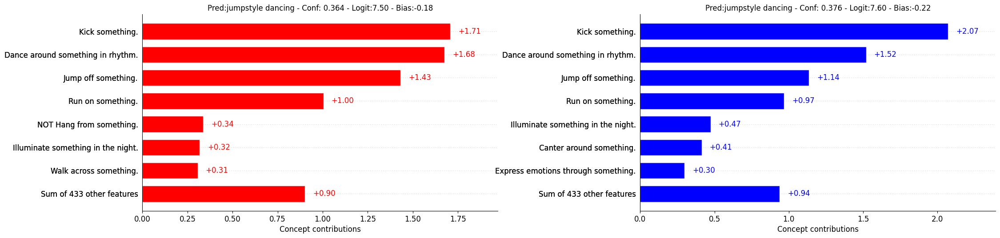

Image:16 Gt:cooking on campfire, 1st Pred:cooking on campfire, 8.931, 2nd Pred:extinguishing fire, 7.610                                                  Image:16 Gt:cooking on campfire, 1st Pred:cooking on campfire, 8.794, 2nd Pred:extinguishing fire, 7.233


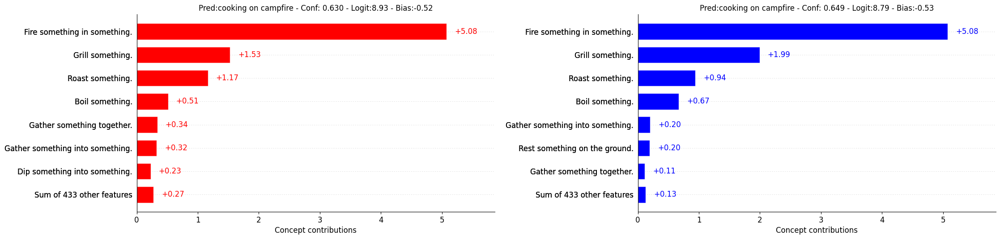

Image:17 Gt:shaking head, 1st Pred:crawling baby, 6.885, 2nd Pred:playing keyboard, 5.487                                                  Image:17 Gt:shaking head, 1st Pred:crawling baby, 6.731, 2nd Pred:playing keyboard, 5.222


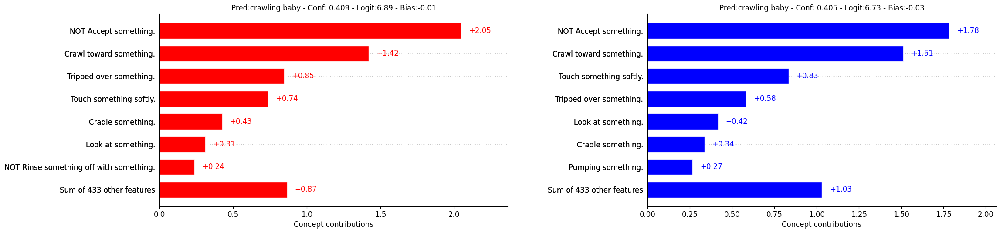

Image:18 Gt:presenting weather forecast, 1st Pred:presenting weather forecast, 7.555, 2nd Pred:news anchoring, 3.378                                                  Image:18 Gt:presenting weather forecast, 1st Pred:presenting weather forecast, 7.421, 2nd Pred:news anchoring, 3.180


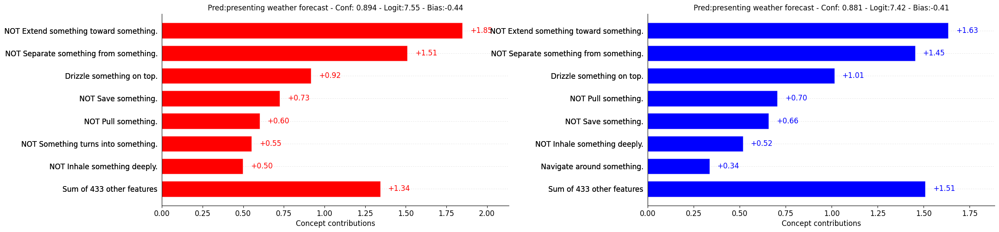

Image:19 Gt:rock scissors paper, 1st Pred:shaking hands, 6.301, 2nd Pred:headbanging, 5.404                                                  Image:19 Gt:rock scissors paper, 1st Pred:shaking hands, 5.776, 2nd Pred:krumping, 5.038


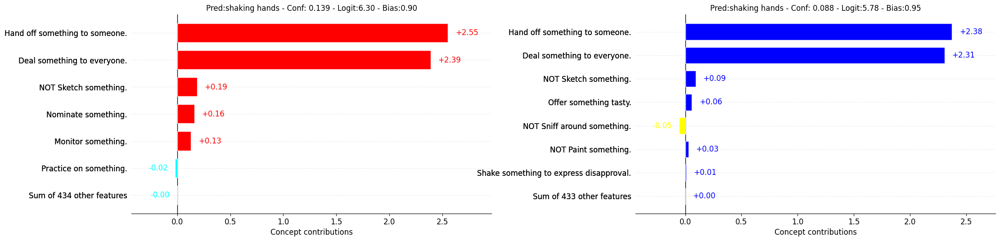

In [13]:
from torchvision.transforms import ToPILImage
from IPython.display import display, HTML, Video
# to_display = random.sample([i for i in range(len(val_pil_data))], k=20)
to_display = [i for i in range(20)]
import matplotlib.pyplot as plt
to_pil_image = ToPILImage()

with torch.no_grad():
    for i in to_display:
        image,label ,path= val_pil_data[i]
        x, _ = val_data_t[i]
        x = x.unsqueeze(0).to(device)
        display(Video(path, embed=True, width=800, height=600))
        image = to_pil_image(image)
        fig, axs = plt.subplots(1, 2, figsize=(5, 5))
        title_anno={'spatial':None,'temporal':None}
        s_outputs,s_concept_act = s_model(x)
        t_outputs, t_concept_act = t_model(x)
        _,s_top_classes = torch.topk(s_outputs[0], dim=0, k=2)
        _,t_top_classes = torch.topk(t_outputs[0], dim=0, k=2)
        # if s_top_classes[0] == t_top_classes[0]:
        #     continue
        
        for j, context in enumerate(['spatial', 'temporal']):
            model = s_model if context=='spatial' else t_model
            concepts = s_concepts if context=='spatial' else t_concepts
            outputs, concept_act = model(x)
            
            top_logit_vals, top_classes = torch.topk(outputs[0], dim=0, k=2)
            conf = torch.nn.functional.softmax(outputs[0], dim=0)
            title_anno[context]="Image:{} Gt:{}, 1st Pred:{}, {:.3f}, 2nd Pred:{}, {:.3f}".format(i, classes[int(label)], classes[top_classes[0]], top_logit_vals[0],
                                                                        classes[top_classes[1]], top_logit_vals[1])
            
            for k in range(1):  
                contributions = concept_act[0]*model.final.weight[top_classes[k], :]
                feature_names = [("NOT " if concept_act[0][i] < 0 else "") + concepts[i] for i in range(len(concepts))]
                values = contributions.cpu().numpy()
                max_display = min(int(sum(abs(values)>0.005))+1, 8)
                title = "Pred:{} - Conf: {:.3f} - Logit:{:.2f} - Bias:{:.2f}".format(classes[top_classes[k]],
                                conf[top_classes[k]], top_logit_vals[k], model.final.bias[top_classes[k]])
                plt.sca(axs[j])
                plots.bar(values, feature_names, max_display=max_display, show=False,title=title, fontsize=12, pos_color=(1, 0, 0) if context == 'spatial' else (0, 0, 1))
                # plots.bar(values, feature_names, max_display=max_display, title=title, fontsize=16,pos_color=(1,0,0) if context=='spatial' else (0,0,1))
        # plt.tight_layout(pad=40.0
        print(title_anno['spatial'],title_anno['temporal'],sep=' '*50)
        plt.subplots_adjust(left=0.1, right=2.5, top=0.85, bottom=0.1, wspace=0.4)
        plt.show()


In [14]:
import subprocess

def convert_avi_to_mp4(input_path, output_path):
    if os.path.exists(output_path):
        print(f"{output_path} 이미 존재합니다. 변환을 건너뜁니다.")
        return
    try:
        # 비디오 코덱은 H.264(libx264), 오디오 코덱은 AAC로 변환
        command = ['ffmpeg', '-i', input_path, '-c:v', 'libx264', '-c:a', 'aac', '-strict', 'experimental', '-b:a', '192k', output_path]
        subprocess.run(command, check=True)
        print(f"변환 성공: {input_path} -> {output_path}")
    except subprocess.CalledProcessError as e:
        print(f"변환 중 오류 발생: {e}")

In [15]:
i=444
x, _ = val_data_t[i]
image,label ,path= val_pil_data[i]
x = x.unsqueeze(0).to(device)
expanded_x = x[:, :, 7:8, :, :].expand(-1, -1, 16, -1, -1)
backbone_feat,concept_activation,outputs = s_model.get_feature(x)

spatial_feat,_,spatial_outputs = s_model.get_feature(expanded_x)

j=1
x, _ = val_data_t[j]
x = x.unsqueeze(0).to(device)
another_backbone_feat,concept_activation,another_outputs = s_model.get_feature(x)


In [16]:
import torch
import torch.nn.functional as F

# 768 크기의 두 텐서 생성
tensor1 = backbone_feat.squeeze(0)
tensor2 = spatial_feat.squeeze(0)

# 코사인 유사도 계산
cos_sim = F.cosine_similarity(tensor1, tensor2, dim=0)
print(cos_sim)

# tensor1 = backbone_feat.squeeze(0)
# tensor2 = another_backbone_feat.squeeze(0)

# # 코사인 유사도 계산
# cos_sim = F.cosine_similarity(tensor1, tensor2, dim=0)

# print(cos_sim)

tensor(0.8578, device='cuda:0', grad_fn=<SumBackward1>)


In [17]:
indices = torch.tensor([635, 739, 565, 728, 709, 159, 425, 402, 761, 395, 480, 320, 399, 627, 642, 95, 450, 608,
                        420, 259, 90, 192, 24, 351, 574, 708, 472, 559, 538, 146, 465, 297, 235, 765, 736, 2,
                        753, 530, 380, 575, 543, 167, 623, 394, 681, 233, 445, 188, 282, 256, 364, 67, 405, 27,
                        572, 524, 280, 414, 122, 324, 123, 227, 432, 455, 126, 634, 368, 370, 216, 48, 4, 442,
                        190, 76, 11, 65, 490, 189, 467, 637, 62, 726, 678, 193, 121, 361, 300, 591, 144, 748,
                        248, 391, 555, 290, 407, 664, 431, 91, 423, 109, 582, 322, 571, 541, 580, 499, 604, 345,
                        665, 116, 502, 42, 568, 755, 483, 685, 669, 603, 362, 180, 152, 55, 142, 131, 381, 632,
                        261, 463, 360, 656, 366, 475, 111, 621, 589, 462, 767, 335, 712, 389, 318, 44, 727, 452,
                        354, 304, 50, 651, 620, 26, 466, 701, 713, 57, 279, 143, 437, 182, 15, 507, 518, 3,
                        587, 162, 230, 640, 512, 661, 234, 426, 89, 667, 191, 347, 610, 340, 613, 556, 183, 653,
                        415, 312, 295, 409, 291, 511, 700, 264, 247, 219, 378, 244, 375, 671, 217, 742, 539, 14,
                        77, 141, 220, 209, 250, 470, 659, 655, 689, 103, 436, 285, 132, 750, 593, 87, 47, 16,
                        21, 43, 581, 751, 721, 157, 493, 174, 283, 579, 315, 474, 128, 707, 682, 602, 228, 714,
                        199, 238, 618, 241, 83, 208, 424, 644, 184, 117, 553, 82, 277, 359, 170, 311, 346, 492,
                        501, 296, 734, 590, 699, 544, 74, 148, 34, 449, 172, 741, 400, 435, 496, 448, 373, 546,
                        225, 134, 112, 249, 510, 269, 127, 135, 563, 200, 348, 281, 5, 536, 158, 168, 577, 397,
                        229, 527, 595, 1, 63, 23, 612, 156, 262, 410, 453, 46])

# 해당 인덱스에 해당하는 값만 추출
tensor1_selected = tensor1[indices]
tensor2_selected = tensor2[indices]

# 코사인 유사도 계산
cos_sim = F.cosine_similarity(tensor1_selected, tensor2_selected, dim=0)
print(cos_sim)


tensor(0.8565, device='cuda:0', grad_fn=<SumBackward1>)


In [18]:

# 적게 활성화된 차원에 해당하는 인덱스
least_activated_indices = torch.tensor([323, 514, 461,  72,  66, 677, 479, 662,  36, 469, 286, 136, 497, 388, 573, 592, 
                                        491, 344, 711, 353, 616, 265, 688, 236, 703, 692, 691, 505, 390, 0, 160, 181, 
                                        521,  79, 529, 336, 658, 243, 647, 569, 102, 371, 349, 355,  68, 519, 503,  20, 
                                        45, 224, 203,  35,  31, 732, 223, 207, 205, 747, 485, 206, 309, 440, 372, 456, 
                                        385, 333, 605, 202, 633, 532, 338, 744, 548, 242, 526,  85, 197, 460, 419, 313, 
                                        396,  52, 495,  37,  56, 457, 118, 299, 352, 187, 231, 438, 625, 471,  69, 274, 
                                        576, 418, 130, 214, 218, 488, 246, 393, 171, 504, 165, 477, 398, 194, 161, 517, 
                                        522, 384, 145, 403, 140, 554, 444, 528, 342, 350, 684,  64, 695,  59,  54,  51, 
                                        710, 325, 720,  33, 288, 729, 731, 735, 306, 738, 740, 746, 8, 757, 6, 758, 762, 
                                        679,  86, 328, 221,  92, 660, 268, 649, 421, 629, 588, 487, 293, 764, 369, 722, 
                                        40, 724,  25,  22, 319, 105, 745,  12, 454, 341, 564, 641, 666,  98, 676, 506,  
                                        78, 387, 169, 672, 211, 759, 754, 326, 668, 763, 520, 680, 104, 636, 458, 547,  
                                        80, 515, 498, 376, 494,  53, 178, 648, 557, 716, 267, 690, 120, 509,  32, 337,  
                                        70, 730, 289, 245, 401, 413, 303, 287, 272, 334, 377, 382, 374, 533, 106, 663, 
                                        650, 696, 561, 139, 628, 115, 535, 531, 153,  88, 154,  41, 486, 484,  38, 433,  
                                        29, 204, 113, 447, 212, 443, 177, 597, 100, 645, 266, 441, 332, 702, 706,  49, 
                                        717, 725, 9, 683, 278, 622, 110, 195, 482, 489, 176, 552, 562, 586, 549, 594, 
                                        257, 600, 670, 412, 756, 737, 733, 476, 619, 723, 314, 316, 718, 358, 379, 631, 
                                        367, 327, 567, 584, 673, 298, 383, 222, 215,  93, 232])

# 해당 인덱스에 해당하는 값만 추출
tensor1_selected_least = tensor1[least_activated_indices]
tensor2_selected_least = tensor2[least_activated_indices]

# 코사인 유사도 계산
cos_sim_least = F.cosine_similarity(tensor1_selected_least, tensor2_selected_least, dim=0)

print(cos_sim_least)

tensor(0.8618, device='cuda:0', grad_fn=<SumBackward1>)


In [19]:
most_activated_indices = torch.tensor([635, 739, 565, 420,  92,  95, 156, 572, 589,  87, 198, 173, 402, 483,  97, 157,
                                       708, 450, 644, 432, 577, 669, 694, 619, 433, 574, 170, 639, 730, 453, 109, 623,
                                       254, 390, 474,  35, 370, 670, 236, 460, 245, 125,  24, 723, 608, 219, 350, 499,
                                       298, 686, 189,  74,  73, 425, 183, 651, 132,  26, 351, 516, 568, 230,  20, 642,
                                       127, 375, 417, 666, 399,  59, 126, 368,  48, 462, 501, 740, 194, 470, 715, 360,
                                       273, 407, 280, 296, 191, 255, 271, 247, 713, 720, 749,  50,  15, 430, 259, 361,
                                       416, 188, 105, 333, 226, 734, 698, 305, 244, 324, 652, 488,  58, 311, 495, 476,
                                       421, 732,  43, 712, 409, 242, 480, 536, 676, 341, 182, 727,  21, 654, 748, 653,
                                       262,  52,   8, 346,  72, 282, 343, 562, 281, 427, 171, 112, 258, 179, 629, 411,
                                       104, 747, 354, 466, 374, 606, 405, 387, 597, 611, 292, 633, 472,  63, 618, 659,
                                       689,  80, 660, 412, 753, 175, 163, 260, 129,  85, 605, 241, 465, 765, 754, 261,
                                       394, 169, 202, 490,  45, 571, 323, 217, 595, 200, 524, 632, 140, 431, 487, 561,
                                       522, 473, 455, 531, 134, 767,  23, 327, 761, 107, 263,   9, 581, 231, 693,  83,
                                       136, 716,  38, 378, 379, 535, 705, 494, 322, 688, 422, 185, 159, 567, 362, 137,
                                       257, 624,  86, 681, 514, 356, 664, 385, 234, 372, 725, 593, 404, 275, 288, 658,
                                       60, 679, 448, 277, 685, 224, 497, 101, 444, 373, 533,  27, 493, 505,  44, 706,
                                       452, 559, 564, 395,  78, 437, 731, 316, 538, 364, 620, 671, 464, 523, 441, 548,
                                       150, 554, 519, 576, 508, 306, 367, 381, 558, 380, 724, 123, 413, 636, 691, 299,
                                       759, 209, 550, 272, 745, 746, 122, 482, 496, 423, 479, 545])

# 해당 인덱스에 해당하는 값만 추출
tensor1_selected_most = tensor1[most_activated_indices]
tensor2_selected_most = tensor2[most_activated_indices]

# 코사인 유사도 계산
cos_sim_most = F.cosine_similarity(tensor1_selected_most, tensor2_selected_most, dim=0)

print(cos_sim_most)

tensor(0.8483, device='cuda:0', grad_fn=<SumBackward1>)


In [20]:
print(f'GT: {classes[label]}\noriginal: {classes[outputs.argmax()]}\nexpand: {classes[spatial_outputs.argmax()]}')

GT: stretching arm
original: massaging back
expand: situp


In [21]:

from IPython.display import display, HTML, Video
# to_display = random.sample([i for i in range(len(val_pil_data))], k=20)
new_path = path.split('.')[:-1][0]+'.mp4'
convert_avi_to_mp4(path,new_path) 
if os.path.exists(new_path):
    print(f"File exists: {new_path}")
    display(Video(new_path, embed=True, width=800, height=600))
else:
    print(f"File not found: {new_path}")

/local_datasets/kinetics400_320p/val/KLLpDAVQqSA.mp4 이미 존재합니다. 변환을 건너뜁니다.
File exists: /local_datasets/kinetics400_320p/val/KLLpDAVQqSA.mp4


In [22]:
import os
import subprocess

def convert_avi_to_mp4(input_path, output_path):
    if os.path.exists(output_path):
        print(f"{output_path} 이미 존재합니다. 변환을 건너뜁니다.")
        return
    try:
        # ffmpeg 명령어 실행 중 stderr와 stdout을 출력하도록 수정
        # command = ['ffmpeg', '-i', input_path, '-c:v', 'libx264', '-c:a', 'aac', '-strict', 'experimental', '-b:a', '192k', output_path]
        command = ['ffmpeg', '-i', input_path, '-c:v', 'libx264', '-c:a', 'copy', output_path]
        subprocess.run(command, check=True)
        print(f"변환 성공: {input_path} -> {output_path}")
    except subprocess.CalledProcessError as e:
        print(f"변환 중 오류 발생: {e}")
        print(f"ffmpeg 오류 메시지: {e.stderr}")

# 예시 사용법
new_path = path.split('.')[:-1][0] + '.mp4'  # .mp4 경로 생성

# 파일이 이미 존재하는지 확인 후 변환
convert_avi_to_mp4(path, new_path)

# 변환된 비디오 출력
from IPython.display import display, Video
if os.path.exists(new_path):
    display(Video(new_path, embed=True, width=800, height=600))
else:
    print(f"파일을 찾을 수 없습니다: {new_path}")

/local_datasets/kinetics400_320p/val/KLLpDAVQqSA.mp4 이미 존재합니다. 변환을 건너뜁니다.


In [23]:
path

'/local_datasets/kinetics400_320p/val/KLLpDAVQqSA.mp4'

In [24]:
new_path

'/local_datasets/kinetics400_320p/val/KLLpDAVQqSA.mp4'

In [25]:
import numpy as np

# Spatial and Temporal top 300 dimensions
spatial = np.array([635, 739, 565, 728, 709, 159, 425, 402, 761, 395, 480, 320, 399, 627, 642,  95, 450, 608,
 420, 259,  90, 192,  24, 351, 574, 708, 472, 559, 538, 146, 465, 297, 235, 765, 736,   2,
 753, 530, 380, 575, 543, 167, 623, 394, 681, 233, 445, 188, 282, 256, 364,  67, 405,  27,
 572, 524, 280, 414, 122, 324, 123, 227, 432, 455, 126, 634, 368, 370, 216,  48,   4, 442,
 190,  76,  11,  65, 490, 189, 467, 637,  62, 726, 678, 193, 121, 361, 300, 591, 144, 748,
 248, 391, 555, 290, 407, 664, 431,  91, 423, 109, 582, 322, 571, 541, 580, 499, 604, 345,
 665, 116, 502,  42, 568, 755, 483, 685, 669, 603, 362, 180, 152,  55, 142, 131, 381, 632,
 261, 463, 360, 656, 366, 475, 111, 621, 589, 462, 767, 335, 712, 389, 318,  44, 727, 452,
 354, 304,  50, 651, 620,  26, 466, 701, 713,  57, 279, 143, 437, 182,  15, 507, 518,   3,
 587, 162, 230, 640, 512, 661, 234, 426,  89, 667, 191, 347, 610, 340, 613, 556, 183, 653,
 415, 312, 295, 409, 291, 511, 700, 264, 247, 219, 378, 244, 375, 671, 217, 742, 539,  14,
  77, 141, 220, 209, 250, 470, 659, 655, 689, 103, 436, 285, 132, 750, 593,  87,  47,  16,
  21,  43, 581, 751, 721, 157, 493, 174, 283, 579, 315, 474, 128, 707, 682, 602, 228, 714,
 199, 238, 618, 241,  83, 208, 424, 644, 184, 117, 553,  82, 277, 359, 170, 311, 346, 492,
 501, 296, 734, 590, 699, 544,  74, 148,  34, 449, 172, 741, 400, 435, 496, 448, 373, 546,
 225, 134, 112, 249, 510, 269, 127, 135, 563, 200, 348, 281,   5, 536, 158, 168, 577, 397,
 229, 527, 595,   1,  63,  23, 612, 156, 262, 410, 453,  46])

temporal = np.array([635, 739, 565, 420,  92,  95, 156, 572, 589,  87, 198, 173, 402, 483,  97, 157, 708, 450,
 644, 432, 577, 669, 694, 619, 433, 574, 170, 639, 730, 453, 109, 623, 254, 390, 474,  35,
 370, 670, 236, 460, 245, 125,  24, 723, 608, 219, 350, 499, 298, 686, 189,  74,  73, 425,
 183, 651, 132,  26, 351, 516, 568, 230,  20, 642, 127, 375, 417, 666, 399,  59, 126, 368,
  48, 462, 501, 740, 194, 470, 715, 360, 273, 407, 280, 296, 191, 255, 271, 247, 713, 720,
 749,  50,  15, 430, 259, 361, 416, 188, 105, 333, 226, 734, 698, 305, 244, 324, 652, 488,
  58, 311, 495, 476, 421, 732,  43, 712, 409, 242, 480, 536, 676, 341, 182, 727,  21, 654,
 748, 653, 262,  52,   8, 346,  72, 282, 343, 562, 281, 427, 171, 112, 258, 179, 629, 411,
 104, 747, 354, 466, 374, 606, 405, 387, 597, 611, 292, 633, 472,  63, 618, 659, 689,  80,
 660, 412, 753, 175, 163, 260, 129,  85, 605, 241, 465, 765, 754, 261, 394, 169, 202, 490,
  45, 571, 323, 217, 595, 200, 524, 632, 140, 431, 487, 561, 522, 473, 455, 531, 134, 767,
  23, 327, 761, 107, 263,   9, 581, 231, 693,  83, 136, 716,  38, 378, 379, 535, 705, 494,
 322, 688, 422, 185, 159, 567, 362, 137, 257, 624,  86, 681, 514, 356, 664, 385, 234, 372,
 725, 593, 404, 275, 288, 658,  60, 679, 448, 277, 685, 224, 497, 101, 444, 373, 533,  27,
 493, 505,  44, 706, 452, 559, 564, 395,  78, 437, 731, 316, 538, 364, 620, 671, 464, 523,
 441, 548, 150, 554, 519, 576, 508, 306, 367, 381, 558, 380, 724, 123, 413, 636, 691, 299,
 759, 209, 550, 272, 745, 746, 122, 482, 496, 423, 479, 545])

# Find the intersection of spatial and temporal dimensions
intersection = np.intersect1d(spatial, temporal)

# Length of intersection
len(intersection)

139